# Particle Swarm Optimization
Particle Swarm Optimization (PSO) is a global optimization algorithm developed by [J. Kennedy and R. Eberhart (1995)](https://ieeexplore.ieee.org/document/488968). The particle swarm algorithm imitates human (or insects) social behaviour. Particles intereact with one another and learn from each other's experience as well as their own, gradually moving into better regions of search space.

## Algorithm Definition
### Notation
* $V_{id}(t)$ is the veocity of the $i$th particle in the $d$th component at time $t$.
* $p_{id}(t)$ is the $d$th location component of the best (local) solution vector found by the particle $i$ before time $t$ and $p_i$ is the $n$ dimensional vector specifying locatin of the best solution found previously.
* $g_{id}(t)$ is the $d$th component of the globally best solution found by time $t$ in the neighbourhood of $i$.
* $X_{id}(t)$ is the current location in search space of particle $i$.
* $S$ is the search space domain
* $N(P_i)$ is the neighborhood of $P_i$

### Particle update
Each particle is associated with a velocity $V_{id}(t)$ and position $x_{id}(t)$. The update for the velocity and position is done component-wise using the follwoing update rule:

$$V_{id}(t+1) = w\cdot V_{id}(t)+C_1\cdot \varphi_1\cdot (p_{id}(t) - x_{id}(t))+C_2\cdot\varphi_2\cdot (g_{id}(t)-x_{id}(t))$$
$$x_{id}(t+1) = x_{id}(t) + V_{id}(t+1)$$

Here, the values of $C_1. C_2. \varphi_1, \varphi_2, w$ are hyperparameters that can be chosen by the user. We see that the velocity update $V_{id}(t+1)$ is a sum of three components:

1. The velocity from the previous time step
2. The cognitive effect of the local best solution $p_{id}(t)$
3. The social effect of the global best solution $g_{id}(t)$.

This can be seen better graphically in the image below [[ref](https://medium.com/analytics-vidhya/implementing-particle-swarm-optimization-pso-algorithm-in-python-9efc2eb179a6)]:

![PSO update rule](Images/pso_update.png)

### Neighborhood Definition
The global best solution $g_{id}(t)$ kept by every particle is considered to be the best solution amongst all particles **in the neighborhood** of the particle. However, as always, the negihborhood of a particle can be defined in many ways. Below are three possible examples of how neighborhoods can be defined.

![PSO Neighborhood definition](Images/pso_neighborhood.png)

### Hyperparameters
The PSO algorithm has the following hyperparameters that are needed to be set by the user:

* $V_{max}$ of maximum velocity which restricts $V_i(t)$ within the interval $[-V_{max}, V_{max}]$
* An inertial weight factor $w$
* Two uniformaly distributed random numbers $\varphi_1$ and $\varphi_2$ that respectively determine the influence of $p(t)$ and $g(t)$ on the velocity update formula
* Two constant multiplier terms $C_1$ and $C_2$ known as "self-confidence" and "swarm confidence" respectively

In general, 

## Python Implemention of PSO
The python implementation below assumes that the neighborhood of a particle is defined as all other particles. It can be easily edited to change the neighborhood policy. It also implements the algorithm using multiprocessing, providing substantial speedup over a serial approach.

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from multiprocessing import cpu_count
from multiprocessing.pool import ThreadPool

In [2]:
class Particle():
    def __init__(self, dim, lb, ub, Vmax, bounded=False):
        '''A single particle part of the swarm.
        :param dim: int, dimension of the search space
        :param lb: (dim, ) numpy array, lower bound of the search space
        :param ub: (dim, ) numpy array, upper bound of the search space
        :param Vmax: double, Maximum allowed velocity of the particle
        '''
        self.position = np.random.uniform(low=lb, high=ub)
        self.velocity = np.random.uniform(low=0, high=Vmax, size=dim)
        self.dim, self.lb, self.ub, self.Vmax = dim, lb, ub, Vmax
        self.pbest_pos = self.position.copy()
        self.pbest_value = np.inf
        self.bounded = bounded
        
    def update_pos(self):
        '''Update the particle position based on velocity.
        The position can be bounded if self.bounded is True. If position goes
        out of bound, it is set to the boudn and the velocity sign is inversed.
        '''
        self.position += self.velocity
        if self.bounded:
            out_below = self.position<self.lb
            out_above = self.position>self.ub
            self.position[out_below] = self.lb[out_below]
            self.velocity[out_below] *= -1
            self.position[out_above] = self.ub[out_above]
            self.velocity[out_above] *= -1


    def update_pbest(self, cost):
        if cost < self.pbest_value:
            self.pbest_value = cost
            self.pbest_pos = self.position.copy()

In [3]:
class PSO():
    def __init__(self, cost_fn, n_particles, dim, lb, ub, Vmax=None, inertial_weight=0.5, self_conf=0.8, swarm_conf=0.9, n_iter=500, target=None, target_error=1e-6, bounded=False, n_jobs=1):
        '''Wrapper for running particle swarm optimization
        :param cost_fn: function which returns the cost to be optimized for one input
        :param n_particles: numebr of aprticles to use in PSO
        :param dim: int, dimension of the search space
        :param lb: (dim, ) numpy array, lower bound of the search space
        :param ub: (dim, ) numpy array, upper bound of the search space
        :param Vmax: double, Maximum allowed velocity of the particle. Default inf
        :param inertial_weight: float, hyperparameter determining the effect of the velocity on next iteration. Default 0.5
        :param self_conf: float, C1 hyperparameter self-confidence. Default 0.8
        :param swarm_conf: float, C2 hyperparameter swarm-confidence. Default 0.9
        :param n_iter: int, number of iterations of PSO to run. Default = 500
        :param target: float, target minimum value to achieve. Default is None
        :param target_error: float, stopping criterion if given target value
        :param bounded: bool, if True, the positions are kept within lb and ub. If false, lb and ub only used for particle initialization
        :param n_jobs: int, number of parallel jobs to run. default=1 (no parallel processing). To use all cores, n_jobs=-1
        '''
        lb, ub = np.array(lb), np.array(ub)
        assert lb.shape[0] == dim and ub.shape[0] == dim
        if Vmax is None: Vmax = np.max(ub)
        self.particles = [Particle(dim, lb, ub, Vmax, bounded=bounded) for _ in range(n_particles)]
        self.cost_fn = cost_fn
        self.gbest_pos = np.random.uniform(low=lb, high=ub)
        self.gbest_value = np.inf
        self.Vmax, self.w, self.C1, self.C2 = Vmax, inertial_weight, self_conf, swarm_conf
        self.max_iter, self.target, self.target_error = n_iter, target, target_error
        self.lb, self.ub = lb, ub

        if n_jobs==-1:
            self.n_jobs = cpu_count()
        else:
            self.n_jobs = n_jobs
        self.pool = ThreadPool(self.n_jobs)
        
    def __del__(self):
        self.pool.close()

    def update_pbest(self, p: Particle):
        '''Update the local best solution of a particle
        :param p: Particle object to be updated
        '''
        cost = self.cost_fn(p.position)
        p.update_pbest(cost)
        return cost

    def update_best(self):
        '''Update the global and local best for the set of particles
        '''
        costs = self.pool.map(self.update_pbest, self.particles)
        costs = np.array(costs)
        mincost_id = costs.argmin()
        mincost = costs[mincost_id]
        if mincost < self.gbest_value:
            self.gbest_value = mincost
            self.gbest_pos = self.particles[mincost_id].position.copy()

    def move_part(self, p: Particle):
        ''' Update the velocity of single particle and perform movement
        :param p: Particle object to move
        '''
        phi1, phi2 = np.random.rand(2)
        new_velocity = (self.w*p.velocity) + (self.C1*phi1*(p.pbest_pos - p.position)) + \
                        (self.C2*phi2*(self.gbest_pos-p.position))
        new_velocity[new_velocity<-self.Vmax] = -self.Vmax
        new_velocity[new_velocity>self.Vmax] = self.Vmax
        p.velocity = new_velocity
        p.update_pos()

    def move_particles(self):
        '''Perform velcoity update on all particles
        '''
        self.pool.map(self.move_part, self.particles)

    def run(self):
        '''Run the PSO algorithm
        '''
        n_iter = 0
        while(n_iter < self.max_iter):
            self.update_best()
            if self.target is not None and (abs(self.gbest_value-self.target)<= self.target_error):
                break
            
            self.move_particles()
            n_iter += 1
        return self.gbest_pos, self.gbest_value

    def visualize(self):
        if self.lb.shape[0]!=2: raise Exception('Only 2D cost function can be visualized')
        x_ax = np.linspace(self.lb[0], self.ub[0], num=500)
        y_ax = np.linspace(self.lb[1], self.ub[1], num=500)
        X, Y = np.meshgrid(x_ax, y_ax)
        Z = self.cost_fn([X, Y])
        besthist_x, besthist_y, besthist_val = [], [], []
        n_iter = 0
        while n_iter < self.max_iter:
            # if n_iter%20 == 0:
            besthist_x.append(self.gbest_pos[0])
            besthist_y.append(self.gbest_pos[1])
            besthist_val.append(self.gbest_value)

            self.update_best()
            if self.target is not None and (abs(self.gbest_value-self.target)<= self.target_error):
                break
            
            self.move_particles()
            n_iter += 1

        fig = plt.figure(figsize=(20,8))
        ax = fig.add_subplot(1,2,1)
        contour_plot = ax.contourf(X,Y,Z, 20, cmap='RdGy')
        ax.plot(besthist_x, besthist_y, c='y', linewidth=1)
        xs, ys = [], []
        for p in self.particles:
            xs.append(p.position[0])
            ys.append(p.position[1])
        ax.scatter(xs, ys, c='b', s=3, zorder=1, label='Particles')
        ax.scatter(self.gbest_pos[0], self.gbest_pos[1], c='y', s=10, zorder=2, marker='*', label='Global Best')
        fig.colorbar(contour_plot)
        ax.legend()
        ax.set_title('Cost function')
        ax.set_xlabel('x1')
        ax.set_xlim([self.lb[0], self.ub[0]])
        ax.set_ylim([self.lb[1], self.ub[1]])
        ax.set_ylabel('x2')

        ax2 = fig.add_subplot(1,2,2)
        ax2.plot(besthist_val)
        ax2.set_title('Change in global best value with time')
        ax2.set_xlabel('No. of iterations')
        ax2.set_ylabel('Global optimal')

        fig.show()
        return

## Testing the implementation using Rastrigin function
The two dimensional Rastrigin function has a global minimum vlaue of $0$ at $x_1 = 0$ and $x_2 = 0$ and is defined as below:

$$f(x_1, x_2) = 20 + x_1^2 + x_2^2 -10(\cos{2\pi x_1} + \cos{2\pi x_2})$$

This function is especially well known for its multitude of local optimals, as can be see in the plotted function further below.

In [4]:
def rastrigin(x):
    '''Return the evaluation of the 2D rastrigin function
    :param x: (2,N) dim input vector
    :returns: (N, ) dim result
    '''
    return 20 + x[0]**2 + x[1]**2 - 10*(np.cos(2*np.pi*x[0]) + np.cos(2*np.pi*x[1]))

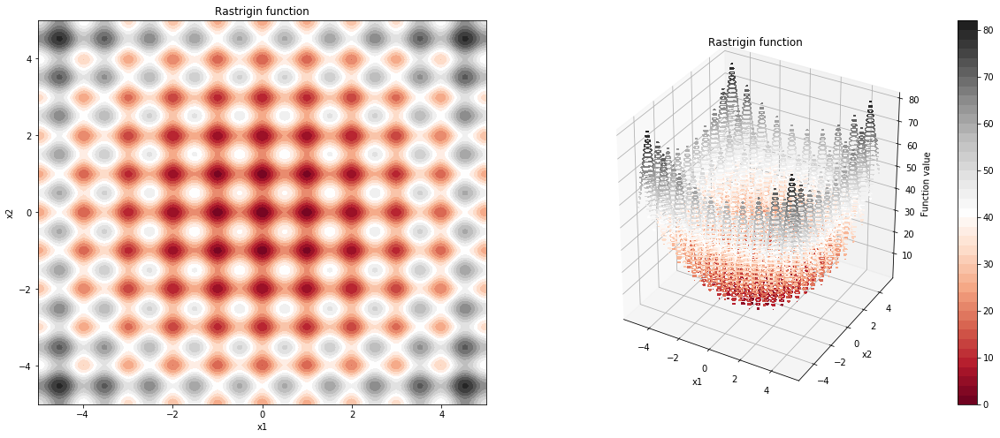

In [5]:
# Lets visulaize the function from [-1.5, 1.5] first
x_ax = np.linspace(-5, 5, num=500)
X, Y = np.meshgrid(x_ax, x_ax)
Z = rastrigin([X, Y])

# Visualize in 2D
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1,2,1)
ax.contourf(X, Y, Z, 20, cmap='RdGy')
ax.set_title('Rastrigin function')
ax.set_xlabel('x1')
ax.set_ylabel('x2')

# Visualize in 3D
ax2 = fig.add_subplot(1,2,2, projection='3d')
mappable = ax2.contourf3D(X,Y,Z, 50, cmap='RdGy')
ax2.set_title('Rastrigin function')
ax2.set_xlabel('x1')
ax2.set_ylabel('x2')
ax2.set_zlabel('Function value')
fig.colorbar(mappable)

In [6]:
C1 = 0.5
C2 = 0.5
Vmax = 5
w = 0.729
n_particles = 20
pso = PSO(rastrigin, n_particles, dim=2, lb=[-10, -10], ub=[10,10], Vmax=Vmax, inertial_weight=w, self_conf=C1, swarm_conf=C2, n_iter=50, n_jobs=1)
best_sol, best_val = pso.run()
print('Best solution at: {} with function value: {}'.format(best_sol, best_val))

Best solution at: [ 4.93744719e-05 -1.95747635e-05] with function value: 5.59666030852668e-07


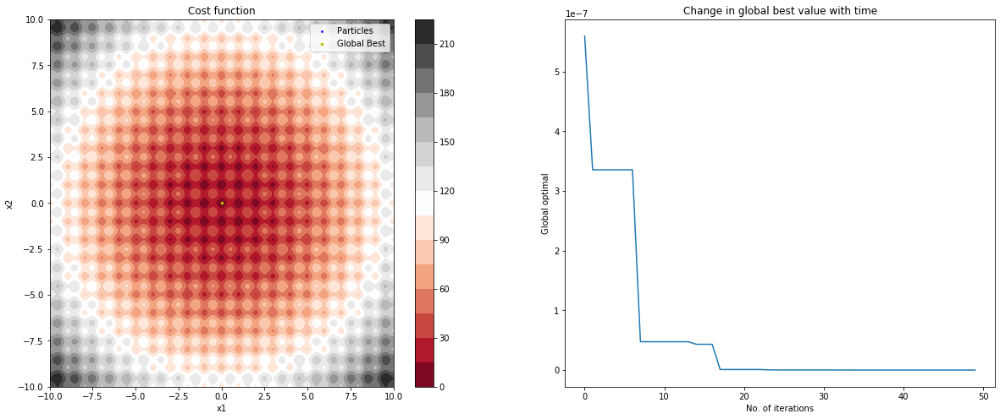

In [7]:
pso.visualize()

You see in the visualization above, that the optimal value is easily found within 50 iterations. Once we have tested the implementation of the PSO algorithm, we can continue to solve some more interesting problems.

## Inverse Kinematics Problem
I found this problem from problem from [here](https://pyswarms.readthedocs.io/en/latest/examples/usecases/inverse_kinematics.html) and found it to be quite interesting. The implementation of the problems have mostly been taken from the same source. The Inverse Kinematics Problem involves finding the optimal pose of a robot arm / manipulator when you are given a desired end point / tip location. The desired location is given in 3D space as a set of $(x, y, z)$ coordinates. The pose of the robot can be expressed as a collection of joint variables that describe how the robot arm bends and extends. This problem is challenging because there can be multiple possible solutions for the same end point (similar to how you can bend your arm in multiple ways while keeping your hand in the same location).

As in the reference page, we solve a 6-DOF (degree of freedom) IK problem with a standard manipulator with 5 revolute joints and 1 prismatic joint, similar to the image below:

![6 DOF Standard Manipulator](Images/IK_problem_arm.png)

The constraints of the joints are:

<center>

| Parameters | Lower Boundary | Upper Boundary |
|:----------:|:--------------:|:--------------:|
| $\theta_1$ |      $-\pi$    |      $\pi$     |
| $\theta_2$ |$-\frac{\pi}{2}$| $\frac{\pi}{2}$|
|    $d_3$   |        1       |        3       |
| $\theta_4$ |      $-\pi$    |      $\pi$     |
| $\theta_5$ |$-\frac{5\pi}{36}$| $\frac{5\pi}{36}$|
| $\theta_6$ |      $-\pi$    |      $\pi$     |

</center>

In [8]:
# Copied from: https://pyswarms.readthedocs.io/en/latest/examples/usecases/inverse_kinematics.html

def getTransformMatrix(theta, d, a, alpha):
    T = np.array([[np.cos(theta) , -np.sin(theta)*np.cos(alpha) ,  np.sin(theta)*np.sin(alpha) , a*np.cos(theta)],
                  [np.sin(theta) ,  np.cos(theta)*np.cos(alpha) , -np.cos(theta)*np.sin(alpha) , a*np.sin(theta)],
                  [0             ,  np.sin(alpha)               ,  np.cos(alpha)               , d              ],
                  [0             ,  0                           ,  0                           , 1              ]
                 ])
    return T

def get_end_tip_position(params):
    # Create the transformation matrices for the respective joints
    t_00 = np.array([[1,0,0,0],[0,1,0,0],[0,0,1,0],[0,0,0,1]])
    t_01 = getTransformMatrix(params[0] , d2        , 0 , -np.pi/2)
    t_12 = getTransformMatrix(params[1] , d2        , 0 , -np.pi/2)
    t_23 = getTransformMatrix(0         , params[2] , 0 , -np.pi/2)
    t_34 = getTransformMatrix(params[3] , d4        , 0 , -np.pi/2)
    t_45 = getTransformMatrix(params[4] , 0         , 0 ,  np.pi/2)
    t_56 = getTransformMatrix(params[5] , d6        ,0  ,  0)

    # Get the overall transformation matrix
    end_tip_m = t_00.dot(t_01).dot(t_12).dot(t_23).dot(t_34).dot(t_45).dot(t_56)

    # The coordinates of the end tip are the 3 upper entries in the 4th column
    pos = np.array([end_tip_m[0,3],end_tip_m[1,3],end_tip_m[2,3]])
    return pos

def opt_func(X):
    target = np.array([-2,2,3])
    dist = np.linalg.norm(get_end_tip_position(X) - target)
    return dist

In [9]:
swarm_size = 50
dim = 6
epsilon = 1.0
Vmax = 2
c1, c2, w = 1.5, 0.5, 1.0
lb = [-np.pi, -np.pi/2 , 1 , -np.pi , -5*np.pi/36 , -np.pi]
ub = [np.pi  ,  np.pi/2 , 3 ,  np.pi ,  5*np.pi/36 ,  np.pi]
d1 = d2 = d3 = d4 = d5 = d6 = 3 # all joint lengths defined to be 3 units long

ik_solver = PSO(opt_func, swarm_size, dim=dim, lb=lb, ub=ub, Vmax=Vmax, inertial_weight=w, self_conf=c1, swarm_conf=c2, n_iter=1000, bounded=True, n_jobs=1)
ik_solver.run()

(array([-2.51813537,  0.42920367,  1.05782343,  1.30242258,  0.43633231,
        -1.50819776]),
 0.10976100945861471)

In [10]:
print('Desired position: [-2, 2, 3]')
print('Robot position: ', get_end_tip_position(ik_solver.gbest_pos))
print('Relative error: ', opt_func(ik_solver.gbest_pos))

Desired position: [-2, 2, 3]
Robot position:  [-1.89124152  1.98891557  3.00980856]
Relative error:  0.10976100945861471


We see that the final position of the robot is very close to the desired location.

## Training a Neural Netowrk using PSO instead of gradient-based methods
Training a neural network usually involves computing the loss function and then propogating that loss across multiple layers using back-propogation. This method is gradient-based, i.e., the weights of the neural network are nudged in the direction opposite to the gradient at any given point. Hoever, this would usually lead to local optimal soilutions being found. As a result, most modern implementations of neural networks use some sort of "velocity" memory to help the network get out of local minimas (see [Adam optimizer](https://arxiv.org/abs/1412.6980)).

Instead of using gradient based methods, we could use the Particle Swarm Optimization to train a neural network to fidn the global optimum as well. As before, the code below is adapted from [this reference](https://pyswarms.readthedocs.io/en/latest/examples/usecases/train_neural_network.html).

In [11]:
from sklearn.datasets import load_iris

data = load_iris()
# Store the features as X and the labels as y
X = data.data
y = data.target

In [12]:
# copied from https://pyswarms.readthedocs.io/en/latest/examples/usecases/train_neural_network.html

def logits_function(p):
    """ Calculate roll-back the weights and biases

    Inputs
    ------
    p: np.ndarray
        The dimensions should include an unrolled version of the
        weights and biases.

    Returns
    -------
    numpy.ndarray of logits for layer 2

    """
    # Roll-back the weights and biases
    W1 = p[0:80].reshape((n_inputs,n_hidden))
    b1 = p[80:100].reshape((n_hidden,))
    W2 = p[100:160].reshape((n_hidden,n_classes))
    b2 = p[160:163].reshape((n_classes,))

    # Perform forward propagation
    z1 = X.dot(W1) + b1  # Pre-activation in Layer 1
    a1 = np.tanh(z1)     # Activation in Layer 1
    logits = a1.dot(W2) + b2 # Pre-activation in Layer 2
    return logits          # Logits for Layer 2

# Forward propagation
def forward_prop(params):
    """Forward propagation as objective function

    This computes for the forward propagation of the neural network, as
    well as the loss.

    Inputs
    ------
    params: np.ndarray
        The dimensions should include an unrolled version of the
        weights and biases.

    Returns
    -------
    float
        The computed negative log-likelihood loss given the parameters
    """

    logits = logits_function(params)

    # Compute for the softmax of the logits
    exp_scores = np.exp(logits)
    probs = exp_scores / np.sum(exp_scores, axis=1, keepdims=True)

    # Compute for the negative log likelihood

    corect_logprobs = -np.log(probs[range(num_samples), y])
    loss = np.sum(corect_logprobs) / num_samples

    return loss

In [13]:
n_inputs = 4
n_hidden = 20
n_classes = 3
c1, c2, w = 0.5, 0.3, 0.9
dim = (n_inputs * n_hidden) + (n_hidden * n_classes) + n_hidden + n_classes
lb = -np.ones(dim)
ub = np.ones(dim)
num_samples = 150

iris_nn = PSO(forward_prop, 100, dim=dim, lb=lb, ub=ub, Vmax=5, inertial_weight=w, self_conf=c1, swarm_conf=c2, n_iter=1000, n_jobs=-1)
iris_nn.run()

(array([ 0.32271812,  0.54392227, -5.77528568,  0.14641894,  2.73483949,
        -5.87102691,  1.57973376,  3.35394823, -1.9752495 , -1.76342948,
        -1.07754161,  3.43457977, -1.10545447, -1.63817078,  0.07322828,
         1.42652819, -3.63159742, -3.98758384,  0.47434583,  2.27146565,
        -2.47683113,  1.90366884, -0.97897634, -3.74450756,  2.59888897,
        -4.64544926,  2.4329136 , -4.82056689, -1.15403116,  0.68393853,
         3.03463018, -1.80836329,  1.22972637, -4.43461369,  2.9029143 ,
         2.28413757, -0.51369696, -4.6271618 ,  1.20714685,  0.06737397,
         0.59140819,  2.02183167,  4.84453547, -3.1730455 , -0.63076123,
        -0.74202985,  0.91266456, -2.82728835, -3.89268113,  3.88260691,
         0.11557775, -3.65418706, -1.02255677, -5.56986018,  3.62540365,
        -6.80011861, -5.61955474,  1.20728896,  3.28879832, -1.2210355 ,
        -0.80966141,  0.90709845,  0.7418316 ,  1.46705533,  4.8516747 ,
        -2.79822737, -1.17838985,  1.67696137, -1.2

In [14]:
def predict(pos):
    """
    Use the trained weights to perform class predictions.

    Inputs
    ------
    pos: numpy.ndarray
        Position matrix found by the swarm. Will be rolled
        into weights and biases.
    """
    logits = logits_function(pos)
    y_pred = np.argmax(logits, axis=1)
    return y_pred

(predict(iris_nn.gbest_pos) == y).mean()

0.98